# Food-101

***

# Overview

### Dataset description

The Food-101 dataset, described in the paper [Food-101 – Mining Discriminative Components with Random Forests](https://www.vision.ee.ethz.ch/datasets_extra/food-101/static/bossard_eccv14_food-101.pdf), is a publicly available large-scale dataset of food images which was created for studying the problem of automatic recognition of dish images.

This dataset contains 101000 images divided into 1000 images (750 training + 250 test) for each of 101 different food categories, chosen as the top 101 most popular and consistently named dishes on [foodspotting.com](http://foodspotting.com). The training images contain some amount of noise such as intense colors and sometimes wrong labels, but were not cleaned on purpose to force the computer vision algorithm to recognize weakly labeled data; on the other hand, the test images were manually cleaned. Although the image size varies, all images have been rescaled to have a maximum side length of 512 pixels. In addition, the dataset was created in such a way to include both very diverse and very similar (visually and semantically) food classes. 

### Exercise requirements

Our goal for [this exercise](https://fellowship.ai/challenge) is to train a ResNet50 or smaller classifier model which can reach at least 85% top-1 accuracy on the validation set, using a reasonable set of data augmentations.

### Approach

To solve the problem we will use **transfer learning** with a ResNet50 model pre-trained on the ImageNet dasaset. In order to improve accuracy we will implement a series of techniques such as data augmentation, progressive resizing, one-cycle learning policy and test time augmentation (TTA), which will be discussed in more detail in the following. The ResNet50 model will be trained mainly using the [fastai](https://www.fast.ai/) library based on [PyTorch](https://pytorch.org/).

### Previous results

As far as we know, the most recent state of the art results for the Food-101 dataset are as follow:

* 90.27% top-1 accuracy, using slice convolutional networks (see the [paper](https://arxiv.org/pdf/1612.06543.pdf));

* 90.52% top-1 accuracy, mainly using transfer learning (see the [blog](https://platform.ai/blog/page/3/new-food-101-sota-with-fastai-and-platform-ais-fast-augmentation-search/));

* 90.4% top-1 accuracy, again mainly using transfer learning (see the [paper](https://arxiv.org/pdf/1806.06193.pdf));

* 93% top-1 accuracy, using the new GPipe parallelism library (see the [paper](https://arxiv.org/pdf/1811.06965.pdf)). 


### Technical specifications

This notebook has been created on the Kaggle platform, which provides free GPU access. In addition, Kaggle makes the Food-101 dataset available for download at https://www.kaggle.com/dansbecker/food-101/home.

***

# Data analysis and preparation

### Files exploration

Let us begin by importing some common useful libraries. The Food-101 dataset downloaded from Kaggle is located by default in the input directory.

In [1]:
import numpy as np 
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from time import time
import os

print(os.listdir("../input"))

%reload_ext autoreload
%autoreload 2
%matplotlib inline

['food-101']


Remember also that on Kaggle kernels we should save files in the working directory if we want to utilize them in other kernels:

In [2]:
os.getcwd()

'/kaggle/working'

We will approach this classification problem with the [fastai](https://www.fast.ai/) library; let us therefore import it:

In [3]:
from fastai import *
from fastai.vision import *

We should now give a look at the various folders in order to understand where the images and auxiliary files are located:

In [4]:
Path('/kaggle/input/food-101').ls()

[PosixPath('/kaggle/input/food-101/food-101'),
 PosixPath('/kaggle/input/food-101/__MACOSX')]

In [5]:
path = Path('/kaggle/input/food-101/food-101')
path.ls()

[PosixPath('/kaggle/input/food-101/food-101/README.txt'),
 PosixPath('/kaggle/input/food-101/food-101/meta'),
 PosixPath('/kaggle/input/food-101/food-101/license_agreement.txt'),
 PosixPath('/kaggle/input/food-101/food-101/images'),
 PosixPath('/kaggle/input/food-101/food-101/.DS_Store')]

Important information about the dataset, especially on how to distinguish training from validation images, is contained in the README file:

In [6]:
print(open(path/'README.txt', 'r').read())

Readme

Structure:
----------
pec/
    images/
        <class_name>/
            <image_id>.jpg
    meta/
        classes.txt
        labels.txt
        test.json
        test.txt
        train.json
        train.txt

All images can be found in the "images" folder and are organized per class. All
image ids are unique and correspond to the foodspotting.com review ids. Thus
the original articles can retrieved trough
  http://www.foodspotting.com/reviews/<image_id>
or through the foodspotting api (http://www.foodspotting.com/api).

The test/train splitting used in the experiment of our paper, can be found in
the "meta" directory.

For any questions contact bossard@vision.ee.ethz.ch




Opening the `train.txt` file with Pandas we notice that the file names are missing the `.jpg` extension, which should then be added by hand:

In [7]:
pd.read_table(path/'meta/train.txt', names= ['file_name']).head()

,file_name
0,apple_pie/1005649
1,apple_pie/1014775
2,apple_pie/1026328
3,apple_pie/1028787
4,apple_pie/1043283


Let us now create two DataFrames containing the list of training and validation images. We will also add a column  indicating if the image is in the validation set (useful for later use of the fastai library) and a column containing the labels (extracted from the file name using regular expressions).

In [8]:
df_train = pd.read_table(path/'meta/train.txt', names= ['file_name'])
df_train['file_name'] = df_train['file_name'] + '.jpg'
df_train['valid'] = False
df_train['label'] = df_train['file_name'].str.extract(r"^(\w+)/\d+.jpg$")

print(df_train.info())

df_train.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75750 entries, 0 to 75749
Data columns (total 3 columns):
file_name    75750 non-null object
valid        75750 non-null bool
label        75750 non-null object
dtypes: bool(1), object(2)
memory usage: 1.2+ MB
None


,file_name,valid,label
0,apple_pie/1005649.jpg,False,apple_pie
1,apple_pie/1014775.jpg,False,apple_pie
2,apple_pie/1026328.jpg,False,apple_pie
3,apple_pie/1028787.jpg,False,apple_pie
4,apple_pie/1043283.jpg,False,apple_pie


In [9]:
df_valid = pd.read_table(path/'meta/test.txt', names= ['file_name'])
df_valid['file_name'] = df_valid['file_name'] + '.jpg'
df_valid['valid'] = True
df_valid['label'] = df_valid['file_name'].str.extract(r"^(\w+)/\d+.jpg$")

print(df_valid.info())

df_valid.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25250 entries, 0 to 25249
Data columns (total 3 columns):
file_name    25250 non-null object
valid        25250 non-null bool
label        25250 non-null object
dtypes: bool(1), object(2)
memory usage: 419.3+ KB
None


,file_name,valid,label
0,apple_pie/1011328.jpg,True,apple_pie
1,apple_pie/101251.jpg,True,apple_pie
2,apple_pie/1034399.jpg,True,apple_pie
3,apple_pie/103801.jpg,True,apple_pie
4,apple_pie/1038694.jpg,True,apple_pie


Finally we should concatenate the training and validation DataFrames, shuffling the rows in order to mix the various food classes:

In [10]:
df = pd.concat([df_train, df_valid], ignore_index = True).sample(frac = 1).reset_index(drop = True)

print(df.info())

df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101000 entries, 0 to 100999
Data columns (total 3 columns):
file_name    101000 non-null object
valid        101000 non-null bool
label        101000 non-null object
dtypes: bool(1), object(2)
memory usage: 1.6+ MB
None


,file_name,valid,label
0,lobster_bisque/1964693.jpg,False,lobster_bisque
1,chicken_wings/3028718.jpg,False,chicken_wings
2,sashimi/1669309.jpg,False,sashimi
3,falafel/2223445.jpg,True,falafel
4,edamame/1928004.jpg,True,edamame


This single DataFrame now contains all the information we need for approaching the Food-101 classification problem.

### Data visualization

We already know from the dataset description that all 101 classes have the same number of training and validation images, so we shouldn't worry about imbalanced classes. We also know that all images have different size, but they have been rescaled in such a way to have a maximum side length of 512 pixels.

We should then give a look at the images in the dataset. As mentioned earlier, **training images** are **noisy** in the sense that they may have intense color or may be misclassified. For example, the following panna cotta image has an unnatural color:

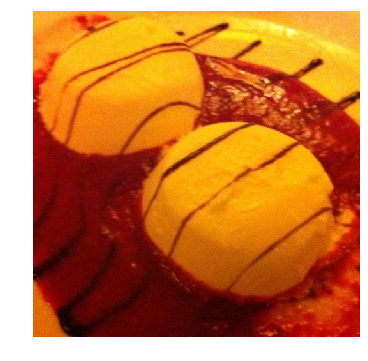

In [11]:
open_image(path/"images/panna_cotta/2668043.jpg").show(figsize = (6,6))

As another example, the following hamburger image is somehow ambiguous since it may have been classified also as french fries:

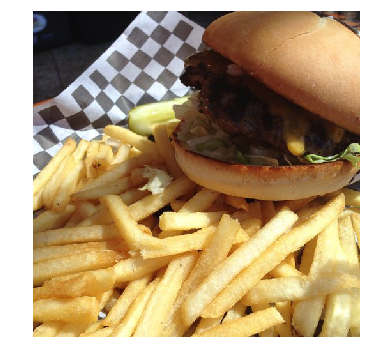

In [12]:
open_image(path/"images/hamburger/3805565.jpg").show(figsize = (6,6))

In [13]:
print('Is french_fries a food class? ', np.isin('french_fries', np.unique(df_train['label'].values)))
print('Is hamburger a food class?    ', np.isin('hamburger', np.unique(df_train['label'].values)))

Is french_fries a food class?  True
Is hamburger a food class?     True


We also notice that some of the images have been rotated:

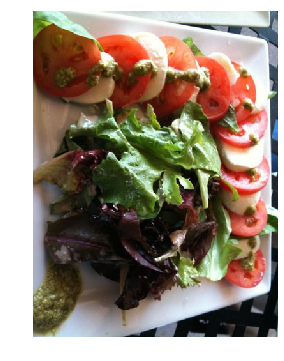

In [14]:
open_image(path/"images/caprese_salad/53354.jpg").show(figsize = (6,6))

Similar problems are present for **validation images**. Indeed although these have been manually cleaned from intense color noise, some of them are still ambiguous; for example the following beef tartare image may have been classified as french fries:

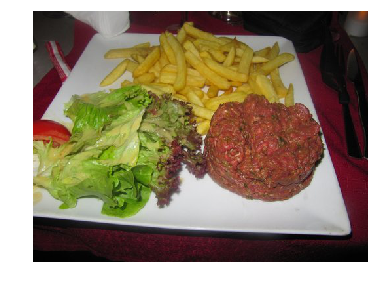

In [15]:
open_image(path/"images/beef_tartare/742228.jpg").show(figsize = (6,6))

In addition, validation images may also be rotated:

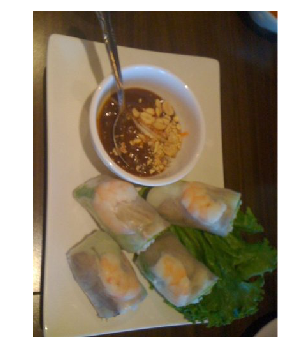

In [16]:
open_image(path/"images/spring_rolls/86528.jpg").show(figsize = (6,6))

Finally, notice that there are also weirder images, such as this chocolate cake or this person classified as a hot dog (why?):

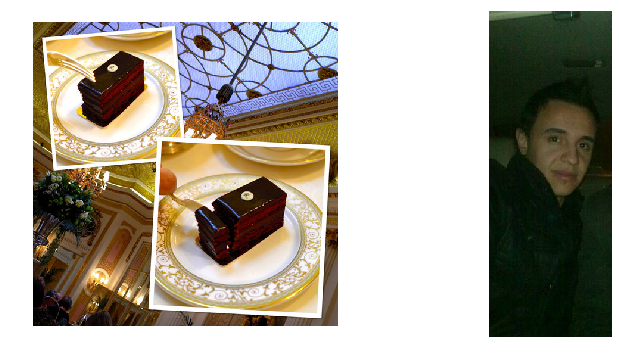

In [17]:
_,axs = plt.subplots(1,2,figsize = (12,6))
open_image(path/"images/chocolate_cake/3311272.jpg").show(ax = axs[0])
open_image(path/'images/hot_dog/1114633.jpg').show(ax = axs[1])

How can we deal with all these problematic images?

As far as the classification ambiguity is concerned, we could build a multi-label classifier in order to take into account the possibility of having more than one type of food represented in a single image: however, the exercise requires us to consider single-label classifiers. The most reasonable option left is then to use both overall accuracy (or top 1 accuracy) and top 5 (or less) accuracy as evaluation metrics: top 5 accuracy will consider the top 5 most probable classes contained in the images and will therefore contain information about different types of food in the same image.

On the other hand, to partially fix the noise, rotation and other similar problems, we can use **data augmentation**: that is, during training we can feed our model not just the original images, but also the images with small modifications added (rotation, cropping, different brightness, ...). In this way our model will be more robust in recognizing foods even if the image is noisy; in addition we will effectively have more images, which can limit the risk of overfitting.

### Data augmentation

The fastai library that we will use to construct our classifier has useful built-in methods for easily performing data augmentation by appling a large number of image transformations. Let us show the effect of a few possible transformations on a random image in our dataset:

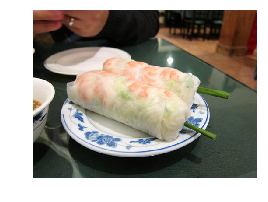

In [18]:
def get_img(): 
    return open_image(path/"images/spring_rolls/250604.jpg")

get_img().show(figsize = (4,4))

Some of the built-in transformations in fastai (called as functions or applied via the `apply_tfms()` method) are: 

* Horizontal flip:

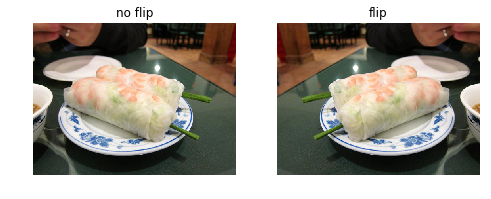

In [19]:
_, axs = plt.subplots(1, 2, figsize = (8,6))
get_img().show(ax = axs[0], title = 'no flip')
flip_lr(get_img()).show(ax = axs[1], title = 'flip')

* Rotation:

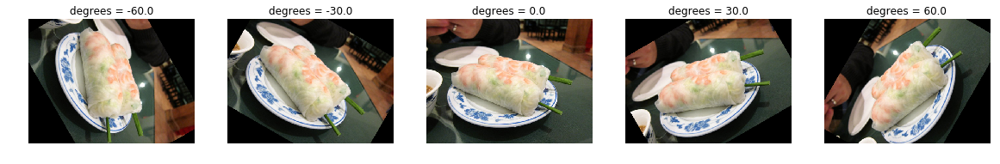

In [20]:
_, axs = plt.subplots(1, 5, figsize=(20,12))
for deg, ax in zip([-60., -30., 0., 30., 60.], axs):
    get_img().apply_tfms(rotate(degrees = deg), padding_mode = 'zeros').show(ax = ax, 
                                                                             title = 'degrees = {}'.format(deg))

* Zoom:

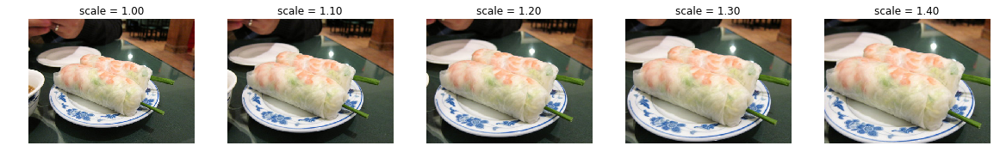

In [21]:
_, axs = plt.subplots(1, 5, figsize = (20,12))
for scale, ax in zip([1., 1.1, 1.2, 1.3, 1.4], axs):
    zoom(get_img(), scale = scale).show(ax = ax, title = 'scale = {:.2f}'.format(scale))

* Symmetric warp:

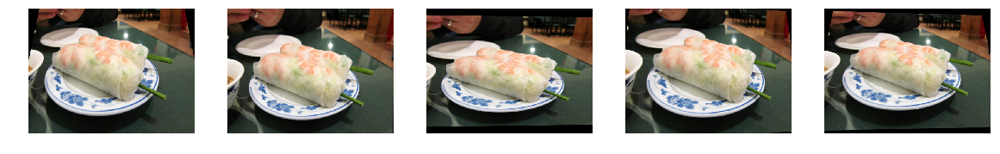

In [22]:
_, axs = plt.subplots(1, 5, figsize = (20,12))
for ax in axs:
    get_img().apply_tfms(symmetric_warp(magnitude = (-0.2,0.2)), padding_mode = 'zeros').show(ax = ax)

* Brightness:

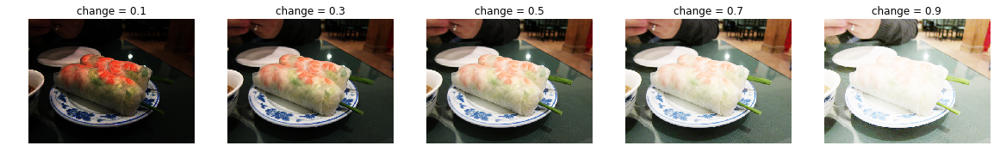

In [23]:
_, axs = plt.subplots(1, 5, figsize=(20,12))
for ch, ax in zip([0.1, 0.3, 0.5, 0.7, 0.9], axs):
    brightness(get_img(), change = ch).show(ax = ax, title = 'change = {}'.format(ch))

* Contrast:

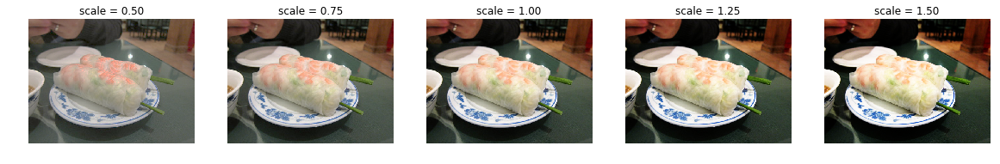

In [24]:
_, axs = plt.subplots(1,5,figsize=(20,12))
for scale, ax in zip([0.5, 0.75, 1.0, 1.25, 1.5], axs):
    contrast(get_img(), scale = scale).show(ax = ax, title = 'scale = {:.2f}'.format(scale))

* Skew (see [here](https://augmentor.readthedocs.io/en/master/userguide/mainfeatures.html)):

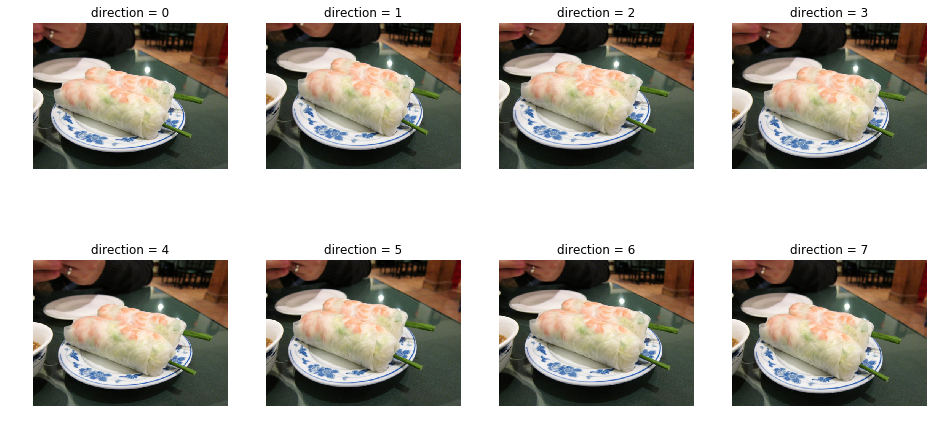

In [25]:
_, axs = plt.subplots(2,4,figsize=(16,8))
for i, ax in enumerate(axs.flatten()):
    skew(get_img(), i, 0.2).show(ax = ax, title = 'direction = {}'.format(i))

* Squish:

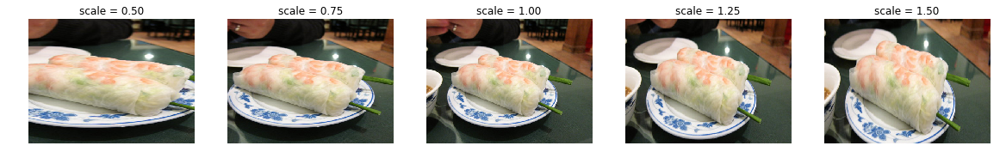

In [26]:
_, axs = plt.subplots(1, 5, figsize = (20,12))
for scale, ax in zip([0.5, 0.75, 1., 1.25, 1.5], axs):
    get_img().squish(scale = scale).show(ax = ax, title = 'scale = {:.2f}'.format(scale))

A full list of all available transformations can be found in the [fastai documentation](https://docs.fast.ai/vision.transform.html)).

In addition, images are usually also cropped or padded when we change their size. The default padding mode in fastai is `reflection`, which pads by taking the pixels symmetric to the border; comparing it with the more familiar zero padding, we get the following (for padding by adding 10 pixels on each side):

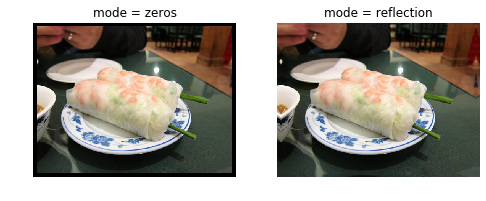

In [27]:
_, axs = plt.subplots(1, 2, figsize = (8,6))
for mode, ax in zip(['zeros', 'reflection'], axs):
    pad(get_img(), 10, mode).show(ax = ax, title = 'mode = {}'.format(mode))

By default, fastai resizes an image while keeping its original ratio so that the smaller size corresponds to the given size, then takes a crop; we could alternatively choose to resize the image while keeping its original ratio so that the bigger size corresponds to the given size and then take a pad, or just squish the image to the given size.

For our exercise we will use the standard set of transformations contained in the `get_transforms()` function, which have been shown to work quite well for most datasets; these consist of:

* Randomly flip the image horizontally with a 50% probability;

* Randomly rotate the image with a maximum angle of ±10 degrees with a 75% probability;

* Randomly zoom the image with a maximum zoom of 1.1 with a 75% probability;

* Randomly apply a ±0.2 brightness and contrast change with a 75% probability;

* Randomly apply a ±0.2 magnitude symmetric warp with a 75% probability.

**Remark**: According to [this blog](https://cristianduguet.com/automatically-finding-useful-augmentations-with-minimal-use-of-compute/) there exists a slightly better set of transformations, optimal for the Food-101 dataset, which also involves skew and squish and has different probabilities and maximum change for the previous transformations. Although we tried to use such set of transformations, we didn't notice an improvement of the final result.

***

# Model

In this classification task we are requested to use a ResNet50 or smaller model, so we will simply choose the ResNet50 architecture. There is however a number of techniques we can apply in order to improve the overall quality of our ResNet50 model.

### Transfer Learning and Discriminative Learning Rates

In addition to applying data augmentation during training as explained earlier, we can also use **transfer learning**: that is, rather than training our model from scratch we can take a ResNet50 model pre-trained on the ImageNet dataset and fine-tune it on our Food-101 dataset, obviously replacing the last layers (especially the output layer) to adapt the model to the task at hand. The [basic idea](https://arxiv.org/pdf/1311.2901.pdf) behind transfer learning is that lower hidden layers in convolutional networks will learn to recognize low-level features of an image such as edges and corners, while upper hidden layers will learn to distinguish high-level features (for example human faces) built on the low-level ones. Since low-level features are common in all images, the model pre-trained on ImageNet will already know about them, although it will likely not know about the high-level features which are relevant to distinguish different foods; we can therefore save computational time and memory by simply using such pre-trained model and replacing the last few hidden layers, which should then be trained to the task of recognizing foods.

Transfer learning is automatically implemented in fastai. As we will see more in detail shortly, calling the `cnn_learner()` function with a ResNet50 architecture will produce a ResNet50 model pre-trained by default on the Imagenet dataset, where however all the layers from the last convolutional one onwards are replaced by two new convolutional layers with ReLU activation (plus dropout and batch normalization) and a final softmax layer with the appropriate number of outputs. All layers but the new ones are frozen by default, so only the weights for the new layers have to be learned. 

After the new layers have been trained, it often helps to unfreeze all layers and train the whole architecture a little longer to fine-tune also the lowest layers to the task at hand. However we know that we shouldn't change the weights of the lowest layers too much, since they already recognize low-level features well: we therefore use **discriminative learning rates**, that is we use a small learning rate for the first part of the model (to avoid big changes in the lowest layers weights) and a gradually higher learning rate for the final part of the model.

To sum up, **transfer learning** is a **two-step** process:

* First we create a model **pre-trained** on ImageNet, we replace the last layers and we train them to our task;

* We then unfreeze all layers and train the whole model a little more, using **discriminative learning rates** to avoid worsening the lowest layers weights.

### Progressive Resizing

Another technique which often helps in getting better models, especially when combined with transfer learning, is **progressive resizing**. This technique consists of first training the model not on the original images, but on a smaller, resized version of them (with resizing performed as discussed earlier); we can then increase the size of the images and train a new model using transfer learning from the first model trained on smaller images, and we can repeat this process until when we reach the original image size. Although a theoretical explanation on why progressive resizing is effective seems to be lacking in the literature, the rough intuition is that although a model trained on smaller size images may learn less features compared to a model trained on the full size image, those features will be among the most important ones (such as the color of the target) and will be present and relevant also for classifying the full image. Taking also into account that training on smaller images is faster and less computationally expensive, it is often a good idea to use progressive resizing as an initial training step.

In our Food-101 dataset all images have a maximum side length of 512 pixels, while the minimum side can vary from 122 to 512:

In [36]:
info = np.array([(path/'images'/df['file_name'].values[i], 
                  open_image(path/'images'/df['file_name'].values[i]).shape[1], 
                  open_image(path/'images'/df['file_name'].values[i]).shape[2]) for i in range(101000)])

In [37]:
print("Minimum side lengths: {}, {}".format(np.min(info[:,1]), np.min(info[:,2])))
print("Maximum side lengths: {}, {}".format(np.max(info[:,1]), np.max(info[:,2])))

Minimum side lengths: 122, 193
Maximum side lengths: 512, 512


We will therefore choose to first train a ResNet50 model (pre-trained on ImageNet) with 256 x 256 images, and then use transfer learning again to train the model on 512 x 512 images (the largest size). More in detail, our training process can be divided into **four steps**, where we use transfer learning two times:

* Step I: create a first ResNet50 model pre-trained on ImageNet, replace the last layers and train them to classify 256 x 256 food images;

* Step II: unfreeze all layers and train the whole first model a little more using discriminative learning rates, always on 256 x 256 food images;

* Step III: create a second ResNet50 model using the weights of the first model, replace the last layers and train them to classify 512 x 512 food images;

* Step IV: unfreeze all layers and train the whole second model a little more using discriminative learning rates, always on 512 x 512 food images.

### One-cycle learning

A last [trick](https://arxiv.org/pdf/1506.01186.pdf) we can use to improve our model's performance is the **one-cycle learning** policy for the learning rate. Usually the learning rate is decreased with time as the training and validation losses start converging: it is however often the case that the minimum of the loss function reached during training is not the optimal global minimum, but only a local minimum or a saddle point. To partially circumvent this issue, the idea of one-cycle learning is that for each epoch we should first gradually **increase** the learning rate for the first few training iterations, and once a specified maximum learning rate is reached we can start decreasing it as usual: indeed increasing the learning rate at the beginning of the epoch can be useful for moving away from the unwanted local minima and saddle points, and as a consequence training with the one-cycle policy will generally result in better models.

It should also be mentioned that the one-cycle learning policy can also be applied to momentum, first decreasing and later increasing it: indeed, experimentally it has been noticed that reducing the momentum when the learning rate is increasing usually gives better results. Intuitively, this is because we want the Stochastic Gradient Descent to move to new directions quickly to find a better minimum, so we need to give more weight to the new gradients.

One-cycle learning is already implemented in fastai an can be called by using the `fit_one_cycle` (rather than `fit`) method while training; setting `max_lr` to a single number will fix the maximum learning rate to that number for all layers, while setting it to `slice()` of two numbers will fix the maximum learning rate in an increasing way across all layers (i.e. corresponds to using discriminative learning rates). Maximum and minimum momentum can also be specified by setting `mom` to a tuple of two numbers.

### Training - step I 

Now that we introduced all techniques we use to train our model, let us start training it. As we mentioned, our training procedure is divided into four steps. In the first step we create a ResNet50 model pre-trained on ImageNet, we replace the last layers while keeping all other layers frozen, and we train the last layers on the Food-101 dataset after having rescaled the images to 256 x 256 size. 

In the fastai library, we should first define an ImageDataBunch object which contains batches of data. This object is defined in various steps:

* First we specify where the file names and the images are: this is done by calling the `from_df(df, path = path/'images')` method for an ImageList object, which indicates that the file names are (by default) in the first column of our dataframe `df` while the images are in the `path/'images'` folder;



* We then specify the training / validation split of the images, contained in the `'valid'` column of our dataframe, via the `split_from_df(col = 'valid')` method;


* Similarly we specify the labels of our images, contained in the `'label'` column of our dataframe, via the `label_from_df(cols = 'label')` method;


* Next we specify the desired size of the images (for now 256 x 256) and the transformations we want to apply for data augmentation (in our case the standard set of transformations given by `get_transforms()`) via the `transform(get_transforms(), size = 256)` method;


* We then need to explicitly create the DataBunch object from the ImageList and specify the batch size `bs` (bs = 128 is all Kaggle allows us) with `databunch(bs = 128)`;


* Finally we should normalize the pixel intensities of our images according to the normalization used for pre-training on the ImageNet dataset, by using `normalize(imagenet_stats)`.

The final result reads:

In [13]:
data = (ImageList.from_df(df, path = path/'images').split_from_df(col = 'valid').label_from_df(cols = 'label')
        .transform(get_transforms(), size = 256).databunch(bs = 128).normalize(imagenet_stats))

As we can see, we created an ImageDataBunch object of 256 x 256 labeled images, splitted in training / validation sets and normalized:

In [14]:
data

ImageDataBunch;

Train: LabelList (75750 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
beef_carpaccio,ceviche,baklava,grilled_cheese_sandwich,onion_rings
Path: /kaggle/input/food-101/food-101/images;

Valid: LabelList (25250 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
cheese_plate,huevos_rancheros,mussels,falafel,red_velvet_cake
Path: /kaggle/input/food-101/food-101/images;

Test: None

Before creating a ResNet50 model, we should first define the metrics we use for evaluation, i.e. top-1 accuracy (or standard accuracy) and top-5 accuracy (we may create `partial` functions but this would not change the name of the functions):

In [15]:
#top_1_accuracy = partial(top_k_accuracy, k = 1)
#top_1_accuracy.__name__ = 'top_1_accuracy'

#top_5_accuracy = partial(top_k_accuracy, k = 5)
#top_5_accuracy.__name__ = 'top_5_accuracy'

In [16]:
def top_1_accuracy(input, targs):
    return top_k_accuracy(input, targs, k = 1)

def top_5_accuracy(input, targs):
    return top_k_accuracy(input, targs, k = 5)

The ResNet50 model is then created by calling `cnn_function()` with the desired data, architecture and metrics:

In [17]:
learn = cnn_learner(data, models.resnet50, metrics = [top_1_accuracy, top_5_accuracy], model_dir = '/tmp/models')

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /tmp/.torch/models/resnet50-19c8e357.pth
102502400it [00:05, 18532014.58it/s]


In order to determine the learning rate we can use the `lr_find()` method, which will run the model for a subset of data at a learning rate increasing at each batch; to determine which learning rate would be best we then just plot the loss as a function of the learning rate and see where it decreases fastest:

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


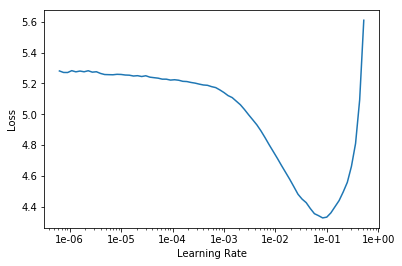

In [18]:
learn.lr_find()
learn.recorder.plot()

In this particular case the default learning rate 3e-3 seems to be good enough. Let us then train the model for a few epochs (we need to define a `summary` function to see the result at each epoch since Kaggle does not output the full summary after committing):

In [19]:
learn.fit_one_cycle(15, slice(3e-3))

epoch,train_loss,valid_loss,top_1_accuracy,top_5_accuracy,time
0,2.338032,1.637152,0.605228,0.849069,22:08
1,1.706252,1.133755,0.695287,0.909624,21:40
2,1.548846,1.004229,0.722931,0.925347,21:35


In [ ]:
def summary(learner, epochs):
    n_bt = len(learner.recorder.losses)//epochs
    losses = [learner.recorder.losses[n_bt*i - 1].item() for i in range(1,epochs + 1)]
    return pd.DataFrame(np.array([losses, learner.recorder.val_losses, 
                                  np.array(learn.recorder.metrics)[:,0], np.array(learn.recorder.metrics)[:,1]]).T, 
                        columns = ['train_loss', 'valid_loss', 'top_1_accuracy', 'top_5_accuracy'], 
                        index=['epoch ' + str(i) for i in range(epochs)])

In [20]:
summary(learn, 15)

,train_loss,valid_loss,top_1_accuracy,top_5_accuracy
epoch 0,2.338032,1.637152,0.605228,0.849069
epoch 1,1.706252,1.133755,0.695287,0.909624
epoch 2,1.548846,1.004229,0.722931,0.925347
epoch 3,1.442251,0.911004,0.747129,0.934099
epoch 4,1.305439,0.855295,0.761584,0.943446
epoch 5,1.201310,0.806939,0.774139,0.945980
epoch 6,1.153067,0.760567,0.786495,0.950376
epoch 7,1.080579,0.730265,0.792356,0.953426
epoch 8,1.029924,0.701719,0.800871,0.955683
epoch 9,0.941607,0.678602,0.807762,0.956792


After 15 epochs the losses are almost stable; it is then time to move to the next step.

### Training - step II

In the second step we unfreeze all layers and continue training, always considering 256 x 256 images. Unfreezing can be done by simply calling the `unfreeze()` method:

In [15]:
learn.unfreeze()

We should then look again for the best learning rate:

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


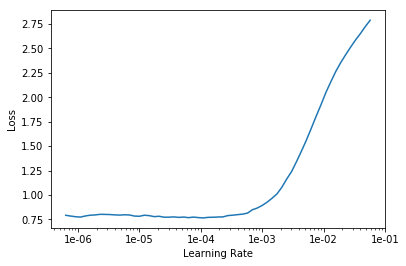

In [16]:
learn.lr_find()
learn.recorder.plot()

Since all layers are unfrozen we should use discriminative learning rates and choose smaller learning rate for the initial layers. This can be specified by using `slice()` with two numbers, which as discussed earlier indicate the range of learning rates to be considered:

In [17]:
learn.fit_one_cycle(15, slice(3e-6, 3e-4))

epoch,train_loss,valid_loss,top_1_accuracy,top_5_accuracy,time
0,0.768001,0.627462,0.823208,0.961030,22:38
1,0.796700,0.610122,0.827446,0.963406,21:17
2,0.767791,0.596983,0.830772,0.964079,21:48


In [18]:
summary(learn, 15)

,train_loss,valid_loss,top_1_accuracy,top_5_accuracy
epoch 0,0.768001,0.627462,0.823208,0.961030
epoch 1,0.796700,0.610122,0.827446,0.963406
epoch 2,0.767791,0.596983,0.830772,0.964079
epoch 3,0.734426,0.578209,0.836198,0.967287
epoch 4,0.665882,0.559394,0.841307,0.968554
epoch 5,0.599856,0.540587,0.845347,0.969149
epoch 6,0.551565,0.530895,0.848792,0.970297
epoch 7,0.490097,0.521324,0.852119,0.972317
epoch 8,0.427465,0.508675,0.857465,0.972634
epoch 9,0.374242,0.513928,0.855525,0.973228


Once the losses converge we can stop training and save the model:

In [19]:
learn.save('/kaggle/working/256-unfrozen')

### Training - step III 

Following the progressive resizing technique, in the third step we create a new ResNet50 model to classify 512 x 512 food images, using transfer learning from the previous model trained on 256 x 256 images. We should first redefine our data, specifying that we want a bigger image size (and consequently we need to use a smaller batch size for GPU reasons):

In [11]:
data = (ImageList.from_df(df, path = path/'images').split_from_df(col = 'valid').label_from_df(cols = 'label')
        .transform(get_transforms(), size = 512).databunch(bs = 32).normalize(imagenet_stats))

We then create a new ResNet50 model, this time not pre-trained on ImageNet (therefore we set `pretrained = False`) but pre-trained on Food-101 images of size 256 x 256 (i.e. our previous model saved as `'/kaggle/working/256-unfrozen'`):

In [13]:
learn = cnn_learner(data, models.resnet50, metrics = [top_1_accuracy, top_5_accuracy], 
                    pretrained = False, model_dir = '/tmp/models')

In [14]:
learn.load('/kaggle/working/256-unfrozen');

Since it is not pre-trained using ImageNet, we should freeze all lowest layers by hand and train only the last layers, as dictated by the transfer learning procedure:

In [15]:
learn.freeze()

We now look again for the best learning rate:

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


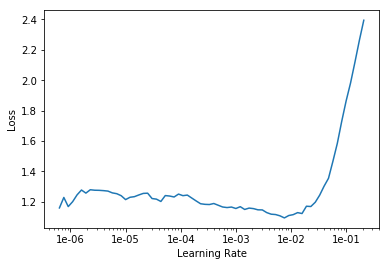

In [16]:
learn.lr_find()
learn.recorder.plot()

Again the default learning rate seems to work fine. Training for a few epochs:

In [17]:
learn.fit_one_cycle(8, slice(3e-3))

epoch,train_loss,valid_loss,top_1_accuracy,top_5_accuracy,time


In [18]:
summary(learn, 8)

,train_loss,valid_loss,top_1_accuracy,top_5_accuracy
epoch 0,0.721380,0.523385,0.852436,0.971683
epoch 1,0.786003,0.544036,0.846574,0.969267
epoch 2,0.817750,0.535335,0.850297,0.970614
epoch 3,0.736836,0.517503,0.853228,0.972158
epoch 4,0.671949,0.492169,0.862416,0.975327
epoch 5,0.592887,0.472525,0.867960,0.976554
epoch 6,0.491210,0.460255,0.871446,0.976792
epoch 7,0.491689,0.457309,0.873030,0.976911


Once the losses stabilize, we stop training and move to the next step.

### Training - step IV

In the final step we unfreeze all layers and train again using discriminative learning rates, always for images of size 512 x 512:

In [15]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


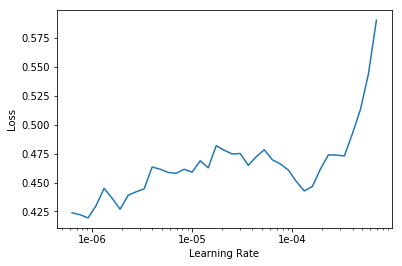

In [16]:
learn.lr_find()
learn.recorder.plot()

In [17]:
learn.fit_one_cycle(7, slice(1e-5, 1e-4))

epoch,train_loss,valid_loss,top_1_accuracy,top_5_accuracy,time


In [18]:
summary(learn, 7)

,train_loss,valid_loss,top_1_accuracy,top_5_accuracy
epoch 0,0.533802,0.481034,0.867406,0.974693
epoch 1,0.638388,0.517908,0.856911,0.972238
epoch 2,0.605673,0.491108,0.862772,0.973624
epoch 3,0.496671,0.449045,0.875168,0.977386
epoch 4,0.379461,0.423955,0.883921,0.979050
epoch 5,0.255761,0.405320,0.889426,0.980673
epoch 6,0.239199,0.398614,0.891327,0.980436


After training is complete, we can save the model:

In [19]:
learn.save('/kaggle/working/512-unfrozen')

***

# Interpretation

Already from the summary we can see that our model is quite good: indeed our top-1 accuracy is around 89.1%, thus satisfying the required > 85% criterium, while our top-5 accuracy is above 98%. We should however look at our results more in detail, to understand where and why we are making misclassifications. For this purpose we can use the functionalities contained in the `ClassificationInterpretation` fastai object, which can be created directly from our model:

In [20]:
interp = ClassificationInterpretation.from_learner(learn)

This object contains both predictions (`interp.probs`) and true labels (`interp.y_true`) for the validation set; we can therefore check our results for top-1 and top-5 accuracies (`item()` is used to convert Torch scalars to numbers):

In [21]:
print("Top 1 accuracy: {:.6f}".format(top_1_accuracy(interp.probs, interp.y_true).item()))
print("Top 5 accuracy: {:.6f}".format(top_5_accuracy(interp.probs, interp.y_true).item()))

Top 1 accuracy: 0.891327
Top 5 accuracy: 0.980436


We can also show the images and predictions of the most misclassified validation images, along with their actual classes, loss and actual class probability:

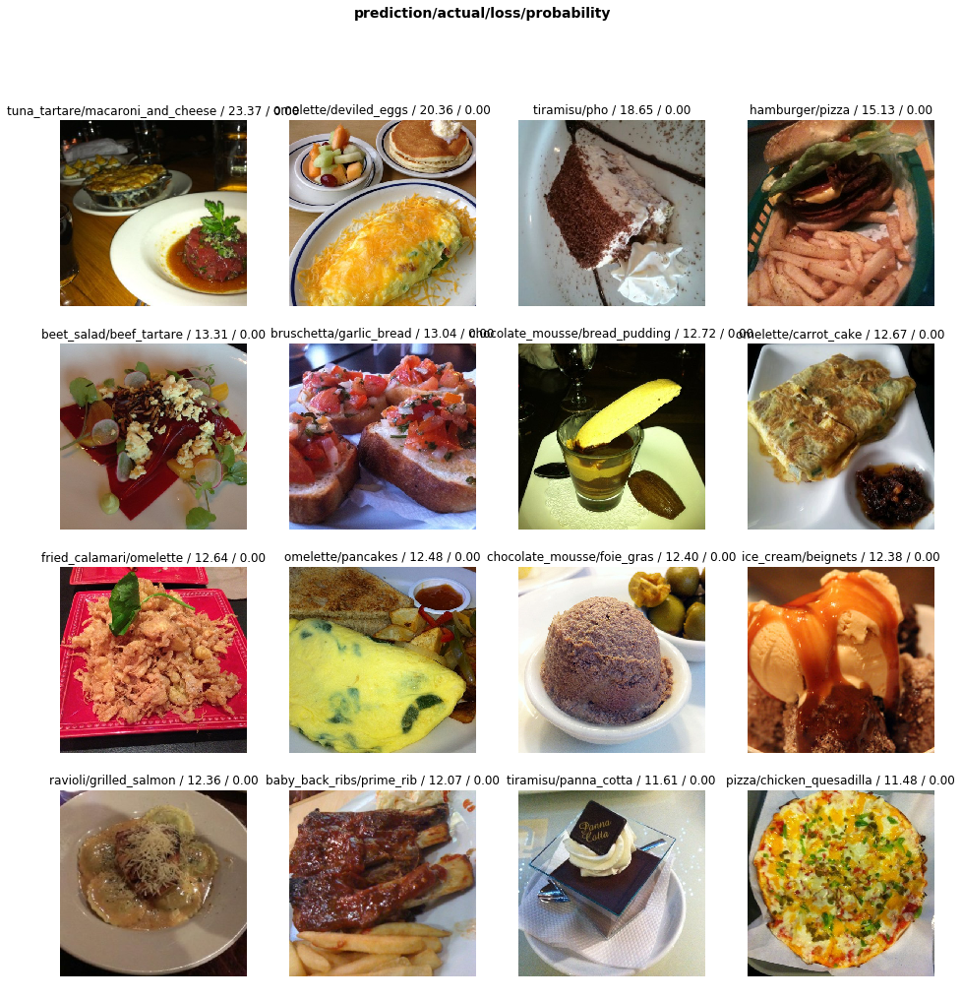

In [22]:
interp.plot_top_losses(16, figsize = (16,16), heatmap = False)

Alternatively we can just print a list of the most misclassified elements, without image; the `most_confused()` method will show us the most confused classes, presented as (actual class, predicted class, number of occurrences):

In [23]:
interp.most_confused(min_val = 10)

[('steak', 'filet_mignon', 40),
 ('filet_mignon', 'steak', 25),
 ('chocolate_mousse', 'chocolate_cake', 24),
 ('beef_tartare', 'tuna_tartare', 20),
 ('apple_pie', 'bread_pudding', 19),
 ('dumplings', 'gyoza', 18),
 ('pork_chop', 'filet_mignon', 18),
 ('steak', 'pork_chop', 18),
 ('tuna_tartare', 'beef_tartare', 18),
 ('chocolate_cake', 'chocolate_mousse', 17),
 ('steak', 'prime_rib', 17),
 ('prime_rib', 'steak', 16),
 ('pork_chop', 'steak', 14),
 ('bread_pudding', 'apple_pie', 13),
 ('hamburger', 'pulled_pork_sandwich', 12),
 ('falafel', 'crab_cakes', 11),
 ('ice_cream', 'frozen_yogurt', 11),
 ('spring_rolls', 'samosa', 11),
 ('chicken_quesadilla', 'breakfast_burrito', 10),
 ('club_sandwich', 'grilled_cheese_sandwich', 10),
 ('lobster_bisque', 'clam_chowder', 10),
 ('ravioli', 'gnocchi', 10),
 ('ravioli', 'lasagna', 10),
 ('tiramisu', 'chocolate_mousse', 10)]

We could also plot the confusion matrix for our model, even if it is a bit hard to read due to the large number of classes:

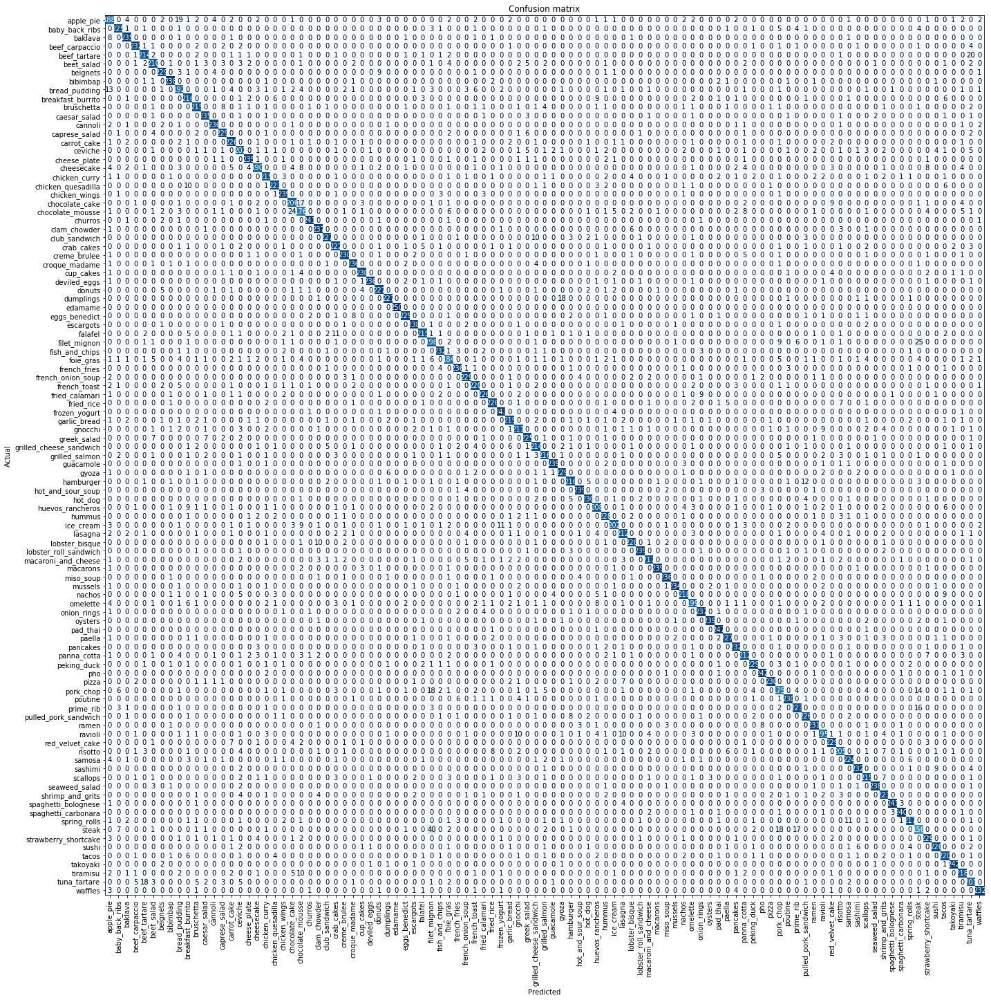

In [24]:
interp.plot_confusion_matrix(figsize = (20,20))

We can easily see that the model has some problem in fine-grained image classification, i.e. it is sometimes hard for the model to distinguish different types of meats (for example steak vs filet mignon vs pork chop vs prime rib). This is not unexpected, since this kind of fine classification may be difficult also for humans. In addition, misclassification can also be due to having multiple food classes in the same image.

In such cases, considering the top-5 accuracy should give much better results, as it is indeed the case in our problem. We could for example plot the confusion matrix for the top-5 accuracy; we first define a `y_preds5` array (slighly modifying the fastai documentation code for the `top_k_accuracy()` function) which contains the actual class if the actual class is in the top-5 predicted class, or the most probable predicted class otherwise:

In [25]:
idxs_pos = [idx for idx, val in enumerate((interp.y_true.unsqueeze(dim = -1).expand_as(interp.probs.topk(k = 5)[1]) 
                                          == interp.probs.topk(k = 5)[1]).max(dim = -1)[0]) if val == 1]
idxs_neg = [idx for idx, val in enumerate((interp.y_true.unsqueeze(dim = -1).expand_as(interp.probs.topk(k = 5)[1]) 
                                          == interp.probs.topk(k = 5)[1]).max(dim = -1)[0]) if val != 1]

y_preds5 = np.zeros(len(interp.y_true), dtype = np.uint8)
y_preds5[idxs_pos] = interp.y_true[idxs_pos]
y_preds5[idxs_neg] = interp.probs.topk(k = 5)[1][idxs_neg,0]

y_preds5

array([22, 93, 57, 47, ..., 53, 56,  8, 69], dtype=uint8)

As a consistency check, let us reproduce the top-5 accuracy from our `y_preds5` array:

In [26]:
(interp.y_true.numpy() == y_preds5).mean().round(6)

0.980436

We can then just use the code in the `plot_confusion_matrix()` fastai function documentation and modify it slightly to plot the desired confusion matrix:

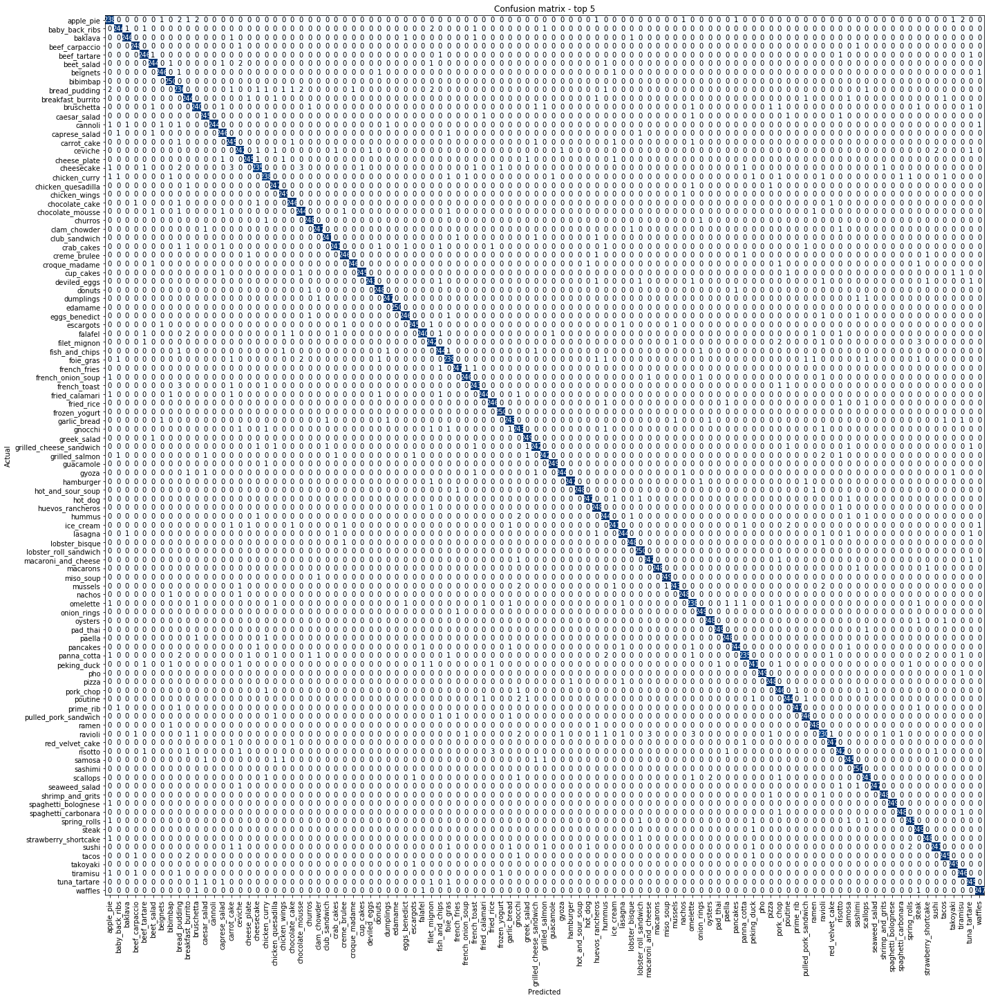

In [27]:
from sklearn.metrics import confusion_matrix

matrix = confusion_matrix(interp.y_true, y_preds5)

fig = plt.figure(figsize = (20,20))
plt.imshow(matrix, interpolation='nearest', cmap = "Blues")
thresh = matrix.max() / 2.
for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
    coeff = f'{matrix[i, j]}'
    plt.text(j, i, coeff, horizontalalignment="center", verticalalignment="center", 
             color="white" if matrix[i, j] > thresh else "black")
plt.title('Confusion matrix - top 5')
tick_marks = np.arange(data.c)
plt.xticks(tick_marks, data.y.classes, rotation=90)
plt.yticks(tick_marks, data.y.classes, rotation=0)
plt.tight_layout()
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

From this matrix it is clear that considering top-5 accuracy can largely alleviate the problems of fine-grained classification and multiple foods in the same image.

### Test Time Augmentation (TTA)

Although the results we obtained are already good enough for the purposes of this exercise, we can get slightly better results by considering **test time augmentation** (TTA). 


In fastai, TTA can be performed when creating the ClassificationInterpretation object by specifying `tta = True`:

In [28]:
interp_tta = ClassificationInterpretation.from_learner(learn, tta = True)

Both top-1 and top-5 accuracies increase slightly after TTA:

In [29]:
print("Top 1 accuracy (with TTA): {:.6f}".format(top_1_accuracy(interp_tta.probs, interp_tta.y_true).item()))
print("Top 5 accuracy (with TTA): {:.6f}".format(top_5_accuracy(interp_tta.probs, interp_tta.y_true).item()))

Top 1 accuracy (with TTA): 0.894693
Top 5 accuracy (with TTA): 0.980752


The fine-grained classification problem still remains, although the number of misclassified examples is now a bit smaller:

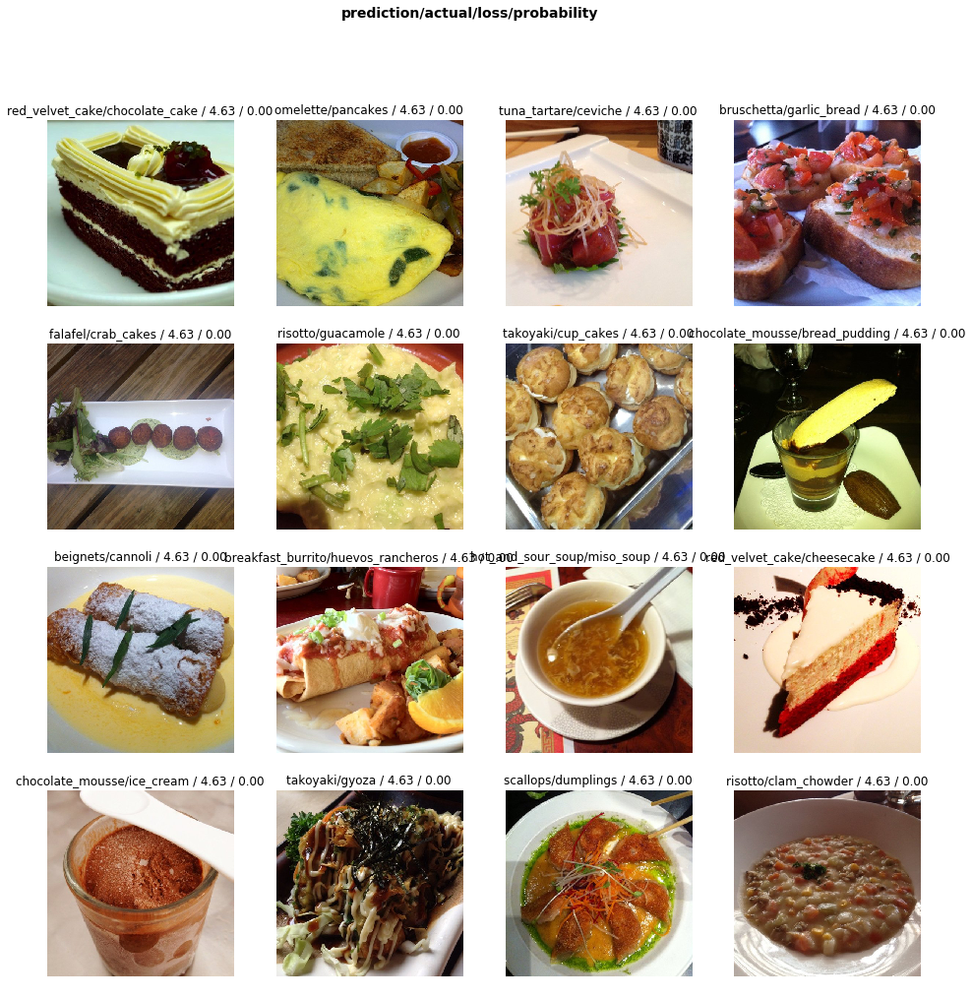

In [30]:
interp_tta.plot_top_losses(16, figsize = (16,16), heatmap = False)

In [31]:
interp_tta.most_confused(min_val = 10)

[('steak', 'filet_mignon', 38),
 ('filet_mignon', 'steak', 23),
 ('prime_rib', 'steak', 21),
 ('beef_tartare', 'tuna_tartare', 20),
 ('chocolate_mousse', 'chocolate_cake', 18),
 ('apple_pie', 'bread_pudding', 17),
 ('dumplings', 'gyoza', 16),
 ('pork_chop', 'filet_mignon', 16),
 ('tuna_tartare', 'beef_tartare', 16),
 ('chocolate_cake', 'chocolate_mousse', 15),
 ('pork_chop', 'steak', 14),
 ('steak', 'prime_rib', 14),
 ('falafel', 'crab_cakes', 13),
 ('ravioli', 'lasagna', 12),
 ('bread_pudding', 'apple_pie', 11),
 ('club_sandwich', 'grilled_cheese_sandwich', 11),
 ('hamburger', 'pulled_pork_sandwich', 11),
 ('ice_cream', 'frozen_yogurt', 11),
 ('spring_rolls', 'samosa', 11),
 ('steak', 'pork_chop', 11),
 ('gnocchi', 'ravioli', 10),
 ('nachos', 'tacos', 10),
 ('sashimi', 'sushi', 10)]

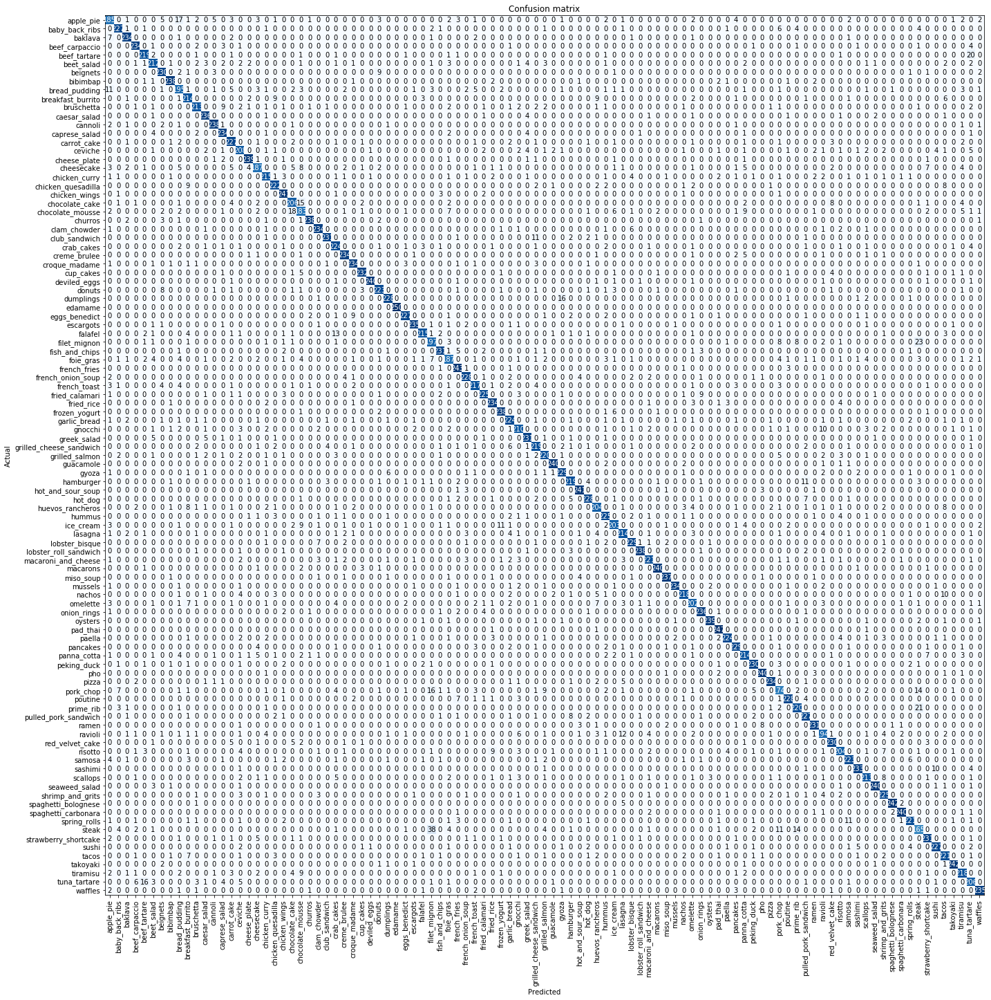

In [32]:
interp_tta.plot_confusion_matrix(figsize = (20,20))

The confusion matrix for the top-5 accuracy remains almost unchanged after TTA:

In [33]:
idxs_pos_tta = [idx for idx, val in enumerate((interp_tta.y_true.unsqueeze(dim = -1).expand_as(interp_tta.probs.topk(k = 5)[1]) 
                                          == interp_tta.probs.topk(k = 5)[1]).max(dim = -1)[0]) if val == 1]
idxs_neg_tta = [idx for idx, val in enumerate((interp_tta.y_true.unsqueeze(dim = -1).expand_as(interp_tta.probs.topk(k = 5)[1]) 
                                          == interp_tta.probs.topk(k = 5)[1]).max(dim = -1)[0]) if val != 1]

y_preds5_tta = np.zeros(len(interp_tta.y_true), dtype = np.uint8)
y_preds5_tta[idxs_pos_tta] = interp_tta.y_true[idxs_pos_tta]
y_preds5_tta[idxs_neg_tta] = interp_tta.probs.topk(k = 5)[1][idxs_neg_tta,0]

y_preds5_tta

array([22, 93, 57, 47, ..., 53, 56,  8, 69], dtype=uint8)

In [34]:
(interp_tta.y_true.numpy() == y_preds5_tta).mean().round(6)

0.980752

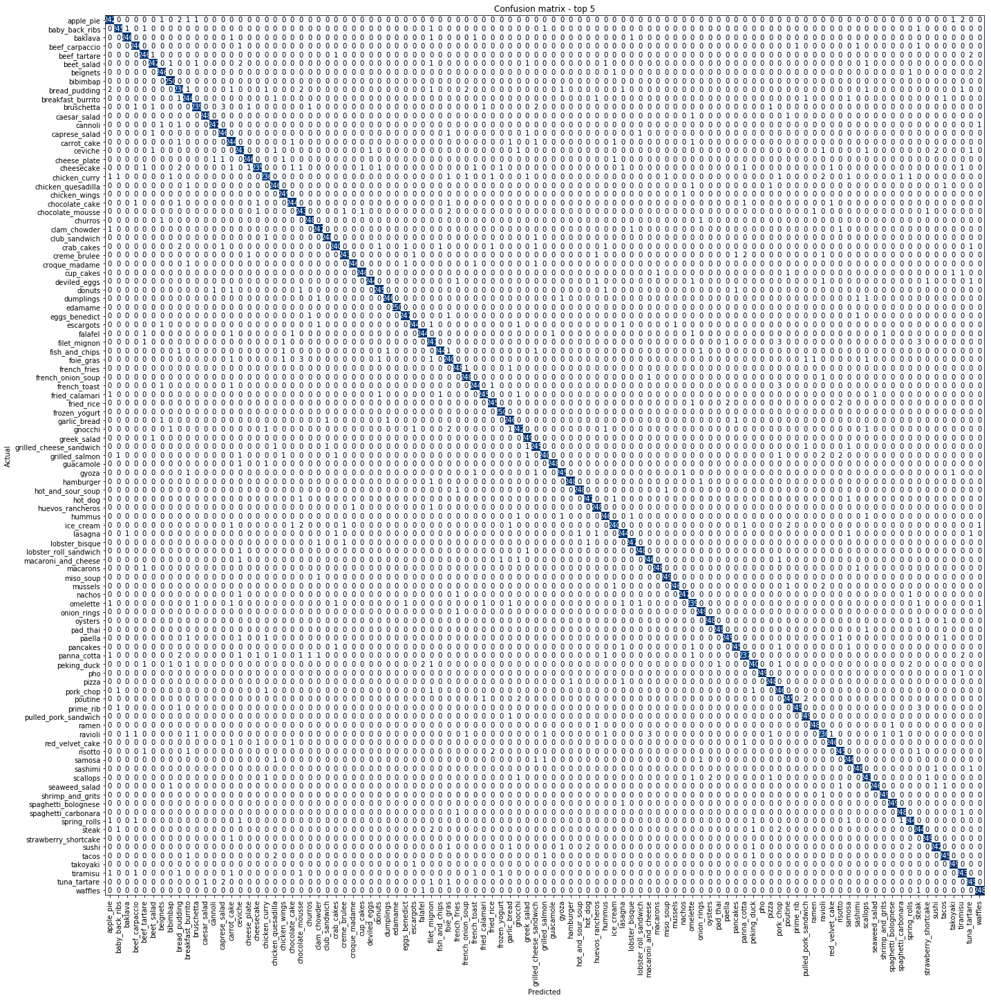

In [35]:
matrix_tta = confusion_matrix(interp_tta.y_true, y_preds5_tta)

fig = plt.figure(figsize = (20,20))
plt.imshow(matrix_tta, interpolation='nearest', cmap = "Blues")
thresh = matrix_tta.max() / 2.
for i, j in itertools.product(range(matrix_tta.shape[0]), range(matrix_tta.shape[1])):
    coeff = f'{matrix_tta[i, j]}'
    plt.text(j, i, coeff, horizontalalignment="center", verticalalignment="center", color="white" if matrix_tta[i, j] > thresh else "black")
plt.title('Confusion matrix - top 5')
tick_marks = np.arange(data.c)
plt.xticks(tick_marks, data.y.classes, rotation=90)
plt.yticks(tick_marks, data.y.classes, rotation=0)
plt.tight_layout()
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

***

# Conclusions

In this exercise we used the fastai library to train a ResNet50 model to classify 101 different categories of food contained in the Food-101 dataset. 

The final 89.1% top-1 accuracy has been obtained by using various tricks and techniques such as data augmentation, transfer learning, discriminative learning rates, progressive resizing and one-cycle learning; performing also test time augmentation can increase the top-1 accuracy up to 89.5%. We should also mention that our result is not too far from the state of the art results mentioned at the beginning, if we exclude the GPipe paper which however uses hardware not available to us.

The main problems which prevent us to get a better result are that some pictures contain more than one food type and many food classes are quite similar (and sometimes hard to distinguish even for a human); it is therefore not surprising that the top-5 accuracy is much better and around 98.1%.

We could still try to improve our result by considering a different set of data augmentation transformations (for example modifying the color of the images), along the lines discussed in [this blog](https://cristianduguet.com/automatically-finding-useful-augmentations-with-minimal-use-of-compute/), or trying to slightly modify regularization parameters and learning rates during the various training steps; this however may take a long time to investigate, since training time is of the order of a few hours.